人脸检测技术在我们生活中经常被用到，人脸面部识别、年龄以及表情的识别都是以人脸为基础。
目前常用的人脸检测工具有：OpenCV Haar级联分类器、MTCNN方式、dlib方式。

### 进入ModelArts

点击如下链接：https://www.huaweicloud.com/product/modelarts.html ， 进入ModelArts主页。点击“立即使用”按钮，输入用户名和密码登录，进入ModelArts使用页面。

### 创建ModelArts notebook

下面，我们在ModelArts中创建一个notebook开发环境，ModelArts notebook提供网页版的Python开发环境，可以方便的编写、运行代码，并查看运行结果。

第一步：在ModelArts服务主界面依次点击“开发环境”、“创建”

![create_nb_create_button](./imgs/create_nb_create_button.png)

第二步：填写notebook所需的参数：

![jupyter](./imgs/notebook1.png)

第三步：配置好notebook参数后，点击下一步，进入notebook信息预览。确认无误后，点击“立即创建”
![jupyter](./imgs/notebook2.png)

第四步：创建完成后，返回开发环境主界面，等待Notebook创建完毕后，打开Notebook，进行下一步操作。
![modelarts_notebook_index](./imgs/modelarts_notebook_index.png)

### 在ModelArts中创建开发环境

接下来，我们创建一个实际的开发环境，用于后续的实验步骤。

第一步：点击下图所示的“启动”按钮，加载后“打开”按钮变从灰色变为蓝色后点击“打开”进入刚刚创建的Notebook
![jupyter](./imgs/notebook3.png)
![jupyter](./imgs/notebook4.png)


第二步：创建一个Python3环境的的Notebook。点击右上角的"New"，然后选择TensorFlow 1.13.1开发环境。

第三步：点击左上方的文件名"Untitled"，并输入一个与本实验相关的名称，如"face_detect_compare"
![notebook_untitled_filename](./imgs/notebook_untitled_filename.png)
![notebook_name_the_ipynb](./imgs/notebook_name_the_ipynb.png)


### 在Notebook中编写并执行代码

在Notebook中，我们输入一个简单的打印语句，然后点击上方的运行按钮，可以查看语句执行的结果：
![run_helloworld](./imgs/run_helloworld.png)


开发环境准备好啦，接下来可以愉快地写代码啦！

## OpenCV

OpenCV（Open Source Computer Vision Library）是一个开源的计算机视觉库，它提供了很多函数，这些函数非常高效地实现了计算机视觉算法（最基本的滤波到高级的物体检测皆有涵盖）。   

Haar特征可以在检测窗口中由放大+平移产生一系列子特征。可以简单理解为算子在图片上横扫过去生成多个框检索是否有人脸的存在。

![jupyter](./imgs/1.jpg)

先来测试双人合影的情况。

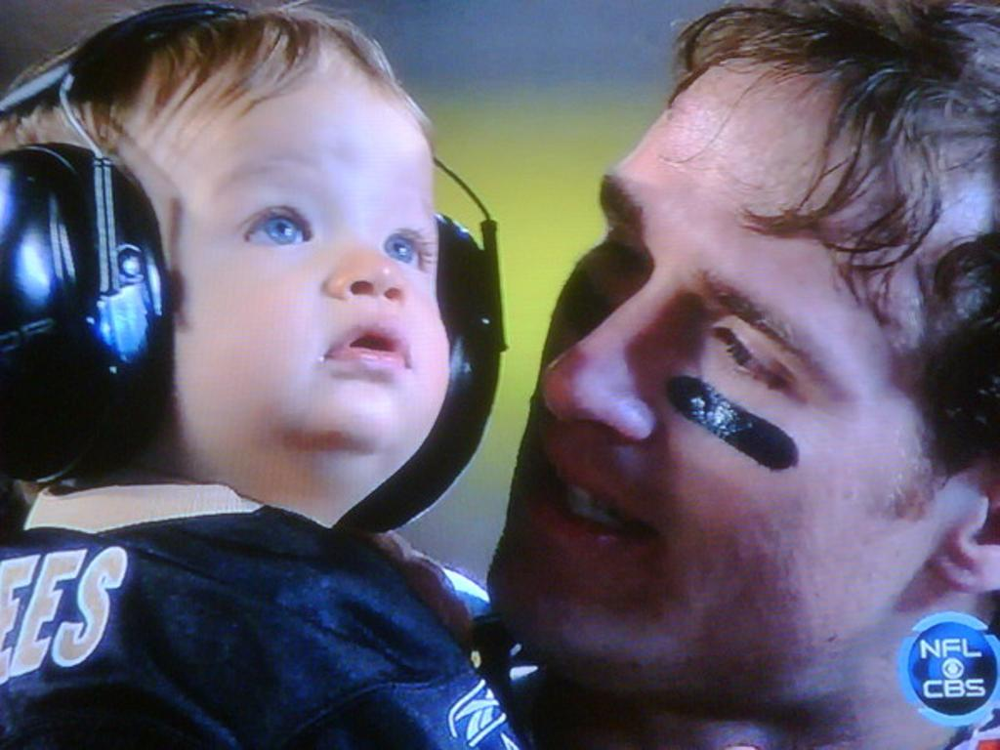

In [1]:
path="/home/ma-user/anaconda3/envs/TensorFlow-1.13.1/lib/python3.6/site-packages/cv2/data/haarcascade_frontalface_alt.xml"
import cv2
face_cascade = cv2.CascadeClassifier(path)
image_path = "./imgs/img_two.jpg" #修改为自己的图片文件名
img = cv2.imread(image_path)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(gray,1.3,5)
for(x,y,w,h) in faces:
    cv2.rectangle(img,(x,y),(x+w,y+h),(0,255,0),2)
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
from PIL import Image
Image.fromarray(img)

四人合影图片的测试结果

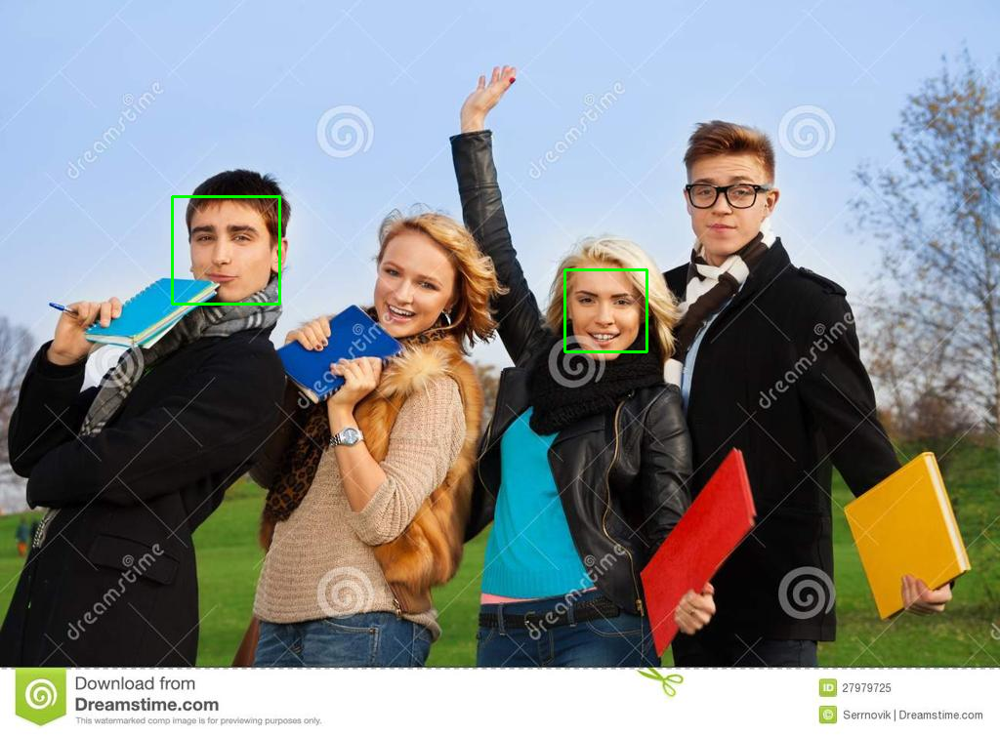

In [2]:
path="/home/ma-user/anaconda3/envs/TensorFlow-1.13.1/lib/python3.6/site-packages/cv2/data/haarcascade_frontalface_alt.xml"
import cv2
face_cascade = cv2.CascadeClassifier(path)
image_path = "./imgs/img_four.jpg" #修改为自己的图片文件名
img = cv2.imread(image_path)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(gray,1.3,5)
for(x,y,w,h) in faces:
    cv2.rectangle(img,(x,y),(x+w,y+h),(0,255,0),2)
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
from PIL import Image
Image.fromarray(img)

再测试有多人的图片

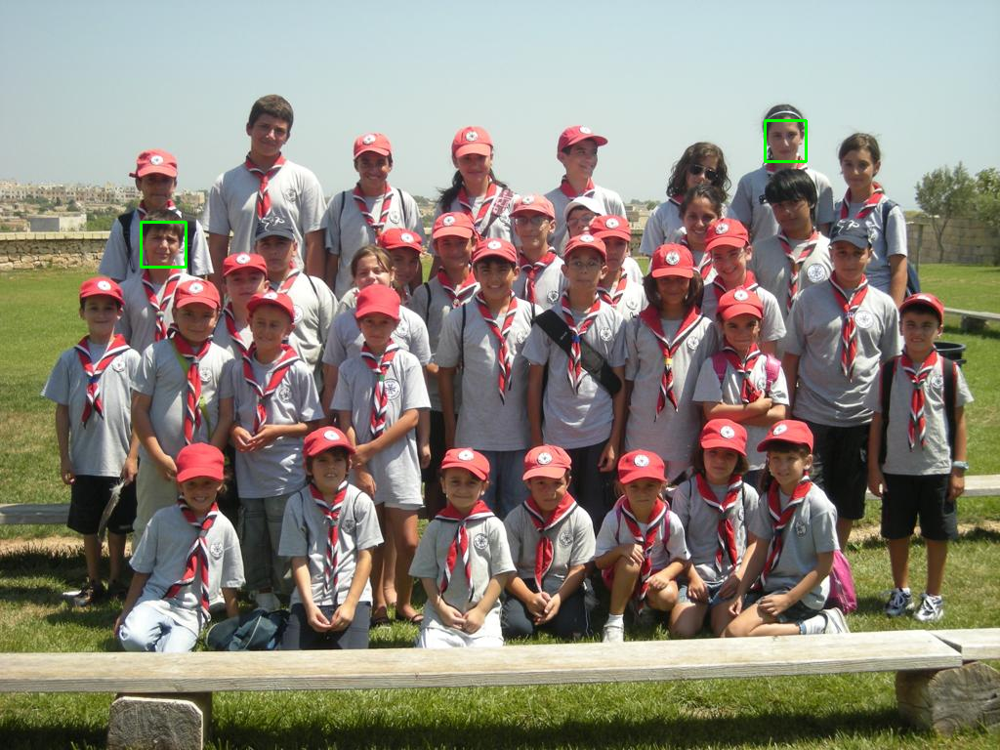

In [3]:
path="/home/ma-user/anaconda3/envs/TensorFlow-1.13.1/lib/python3.6/site-packages/cv2/data/haarcascade_frontalface_alt.xml"
import cv2
face_cascade = cv2.CascadeClassifier(path)
image_path = "./imgs/img_many.jpg" #修改为自己的图片文件名
img = cv2.imread(image_path)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(gray,1.3,5)
for(x,y,w,h) in faces:
    cv2.rectangle(img,(x,y),(x+w,y+h),(0,255,0),2)
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
from PIL import Image
Image.fromarray(img)

## dlib
这种方式不仅能够检测到人脸的区域，还能够通过68个关键点检测出人脸及五官的轮廓，从而可以完成进一步的面部识别任务。

In [4]:
import os
from modelarts.session import Session
sess = Session()

if sess.region_name == 'cn-north-1':
    bucket_path="modelarts-labs/notebook/DL_face_detector/face_detector.tar.gz"
elif sess.region_name == 'cn-north-4':
    bucket_path="modelarts-labs-bj4/notebook/DL_face_detector/face_detector.tar.gz"
else:
    print("请更换地区到北京一或北京四")

if not os.path.exists('./models/detector.dat'):    
    sess.download_data(bucket_path=bucket_path, path="./face_detector.tar.gz")

Successfully download file modelarts-labs-bj4/notebook/DL_face_detector/face_detector.tar.gz from OBS to local ./face_detector.tar.gz


In [5]:
if os.path.exists('./face_detector.tar.gz'):
    # 使用tar命令解压资源包
    os.system("tar -xf ./face_detector.tar.gz")
    # 清理压缩包
    os.system("rm ./face_detector.tar.gz")

## 安装dlib，成功后点击Kernek->Restart

In [6]:
!pip install dlib==19.17.0
!pip install numpy==1.16.2

You are using pip version 9.0.1, however version 20.2.4 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
You are using pip version 9.0.1, however version 20.2.4 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


测试双人合影的效果

number of faces datected: 2
Detection{0}: Left:{172} Top:{128 } Right:{524} Bottom:{480} 
Detection{1}: Left:{467} Top:{172 } Right:{974} Bottom:{679} 


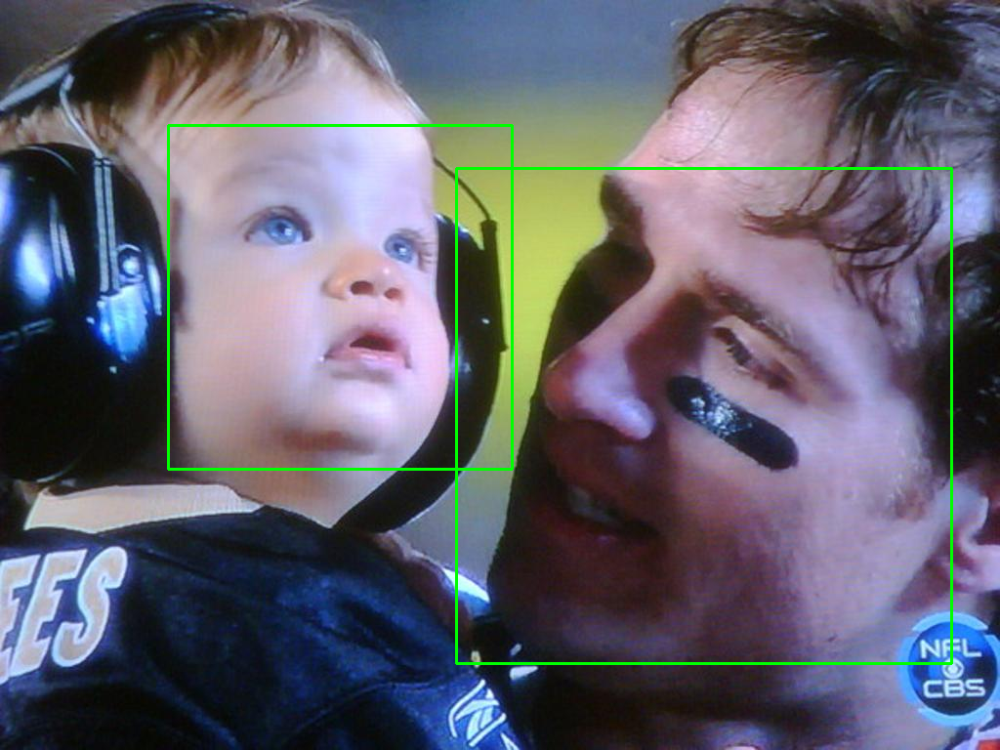

In [1]:
import cv2
import dlib
cnn_face_detector=dlib.cnn_face_detection_model_v1("./models/detector.dat")
image=dlib.load_rgb_image("./imgs/img_two.jpg")
dets=cnn_face_detector(image,1)
print("number of faces datected: {}".format(len(dets)))
for i,d in enumerate(dets):
    print("Detection{%s}: Left:{%s} Top:{%s } Right:{%s} Bottom:{%s} " % (i,format(d.rect.left()),format(d.rect.top()),format(d.rect.right()),format(d.rect.bottom())))
    cv2.rectangle(image,(d.rect.left(),d.rect.top()),(d.rect.right(),d.rect.bottom()),(0,255,0),2)
from PIL import Image
Image.fromarray(image)

四人合影图片的测试结果

number of faces datected: 4
Detection{0}: Left:{583} Top:{291 } Right:{651} Bottom:{359} 
Detection{1}: Left:{186} Top:{206 } Right:{268} Bottom:{288} 
Detection{2}: Left:{700} Top:{156 } Right:{782} Bottom:{238} 
Detection{3}: Left:{358} Top:{246 } Right:{456} Bottom:{344} 


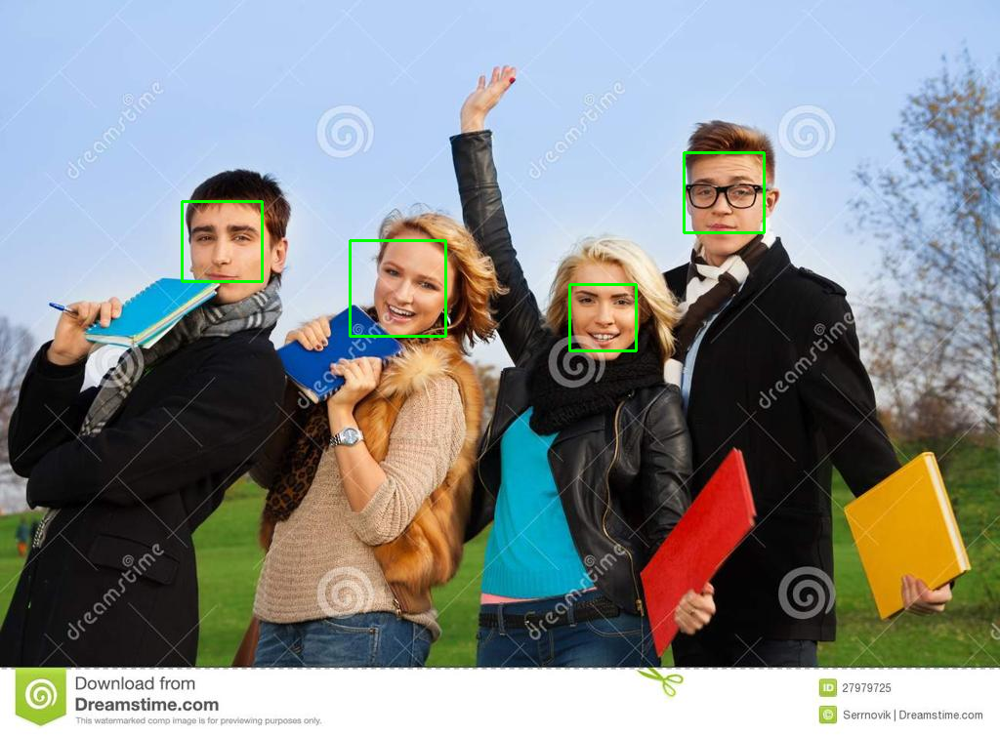

In [2]:
import dlib
cnn_face_detector=dlib.cnn_face_detection_model_v1("./models/detector.dat")
image=dlib.load_rgb_image("./imgs/img_four.jpg")
dets=cnn_face_detector(image,1)
print("number of faces datected: {}".format(len(dets)))
for i,d in enumerate(dets):
    print("Detection{%s}: Left:{%s} Top:{%s } Right:{%s} Bottom:{%s} " % (i,format(d.rect.left()),format(d.rect.top()),format(d.rect.right()),format(d.rect.bottom())))
    cv2.rectangle(image,(d.rect.left(),d.rect.top()),(d.rect.right(),d.rect.bottom()),(0,255,0),2)
from PIL import Image
Image.fromarray(image)

多人合影的测试结果

number of faces datected: 28
Detection{0}: Left:{717} Top:{449 } Right:{756} Bottom:{489} 
Detection{1}: Left:{453} Top:{477 } Right:{492} Bottom:{517} 
Detection{2}: Left:{81} Top:{301 } Right:{120} Bottom:{341} 
Detection{3}: Left:{781} Top:{453 } Right:{820} Bottom:{493} 
Detection{4}: Left:{521} Top:{209 } Right:{560} Bottom:{249} 
Detection{5}: Left:{253} Top:{117 } Right:{292} Bottom:{157} 
Detection{6}: Left:{145} Top:{229 } Right:{184} Bottom:{269} 
Detection{7}: Left:{485} Top:{261 } Right:{524} Bottom:{301} 
Detection{8}: Left:{181} Top:{305 } Right:{220} Bottom:{345} 
Detection{9}: Left:{921} Top:{317 } Right:{960} Bottom:{357} 
Detection{10}: Left:{697} Top:{209 } Right:{736} Bottom:{249} 
Detection{11}: Left:{577} Top:{253 } Right:{616} Bottom:{293} 
Detection{12}: Left:{781} Top:{121 } Right:{820} Bottom:{161} 
Detection{13}: Left:{857} Top:{149 } Right:{896} Bottom:{189} 
Detection{14}: Left:{725} Top:{245 } Right:{764} Bottom:{285} 
Detection{15}: Left:{317} Top:{453 } 

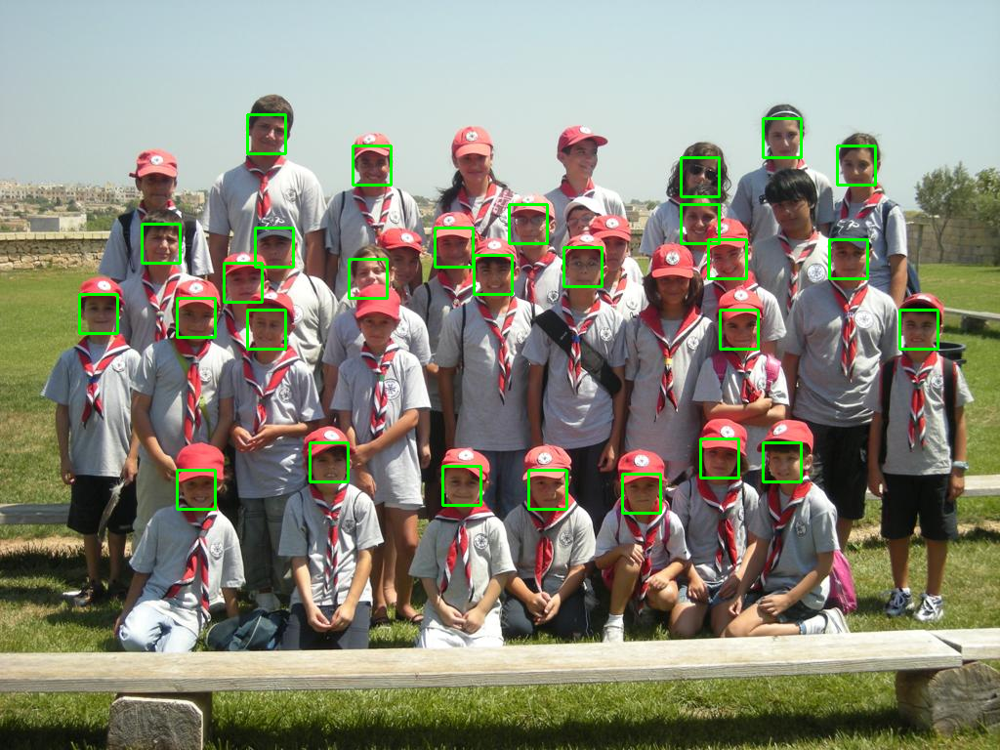

In [3]:
import dlib
cnn_face_detector=dlib.cnn_face_detection_model_v1("./models/detector.dat")
image=dlib.load_rgb_image("./imgs/img_many.jpg")
dets=cnn_face_detector(image,1)
print("number of faces datected: {}".format(len(dets)))
for i,d in enumerate(dets):
    print("Detection{%s}: Left:{%s} Top:{%s } Right:{%s} Bottom:{%s} " % (i,format(d.rect.left()),format(d.rect.top()),format(d.rect.right()),format(d.rect.bottom())))
    cv2.rectangle(image,(d.rect.left(),d.rect.top()),(d.rect.right(),d.rect.bottom()),(0,255,0),2)
from PIL import Image
Image.fromarray(image)

## MTCNN
同样直接调用人脸检测方法就可以完成对人脸区域以及人脸五个关键点的检测（眼睛、鼻子、嘴角）。MTCNN的安装和使用都十分简单，虽然没有dlib的检测结果丰富，但对于人脸识别，年龄表情等任务已经足够，所以使用十分普遍。

In [4]:
!pip install mtcnn==0.0.8

You are using pip version 9.0.1, however version 20.2.4 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


安装后记得点击上方Restart按钮

双人合影的效果

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
Deprecated in favor of operator or tf.math.divide.


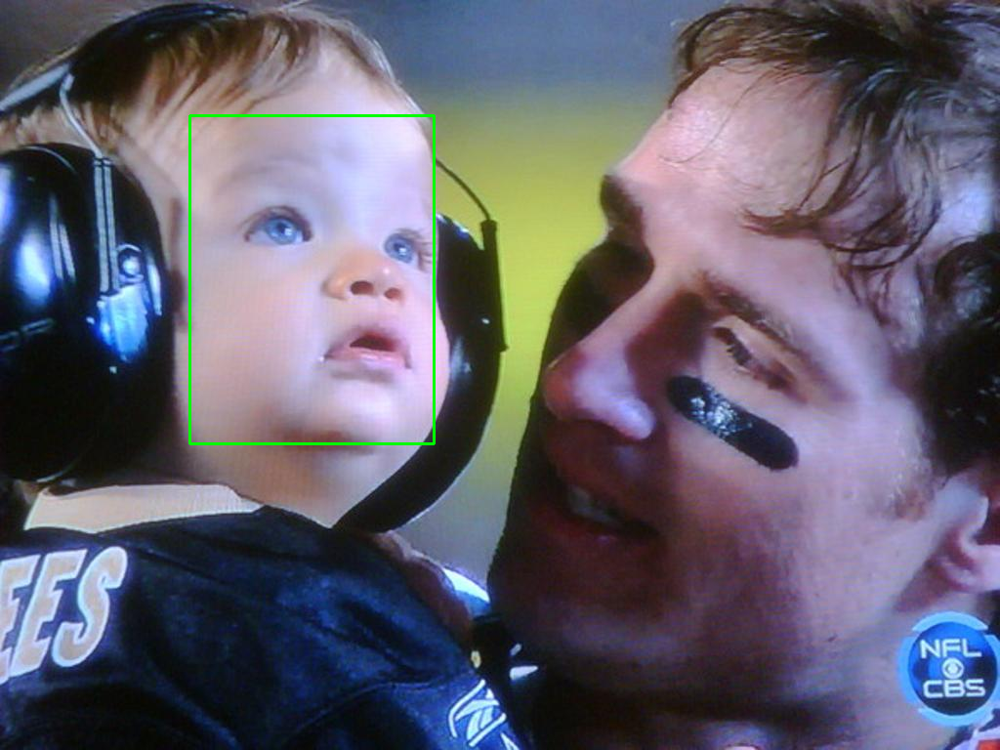

In [1]:
from mtcnn.mtcnn import MTCNN
detector = MTCNN()
import cv2
img = cv2.cvtColor( cv2.imread("./imgs/img_two.jpg"), cv2.COLOR_BGR2RGB)
from PIL import Image
Image.fromarray(img)
result = detector.detect_faces(img)
# print(result)
for result in result:
#     print(result['box'][0])
    cv2.rectangle(img,(result['box'][0],result['box'][1]),(result['box'][2]+result['box'][0],result['box'][3]+result['box'][1]),(0,255,0),2)
from PIL import Image
Image.fromarray(img)

四人合影图片的测试结果

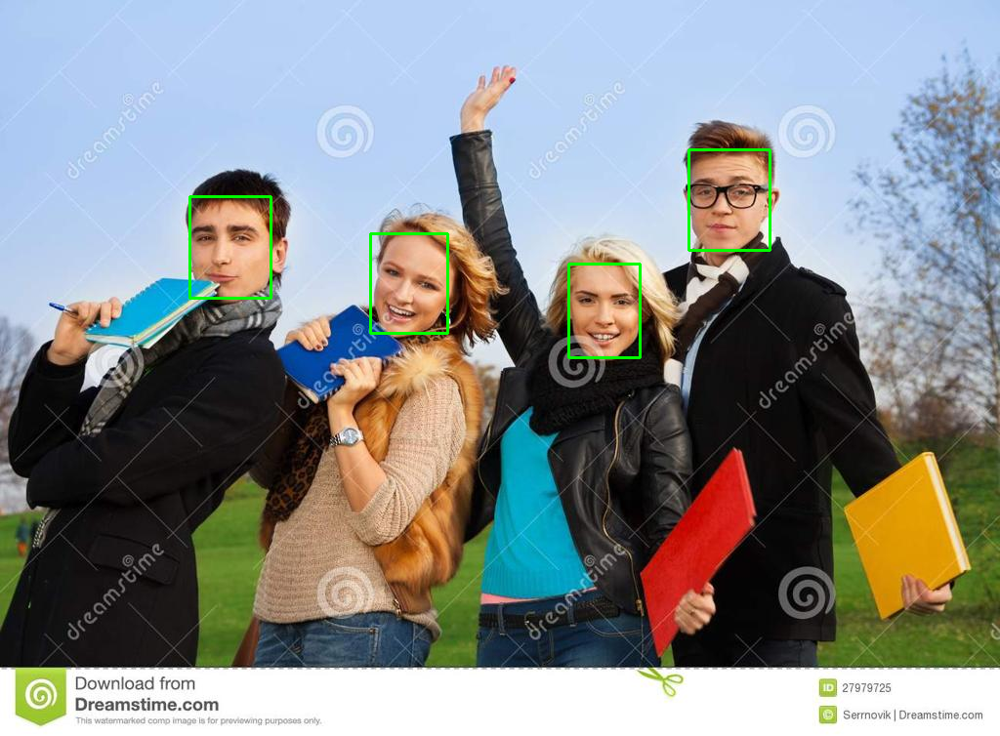

In [2]:
from mtcnn.mtcnn import MTCNN
detector = MTCNN()
import cv2
img = cv2.cvtColor( cv2.imread("./imgs/img_four.jpg"), cv2.COLOR_BGR2RGB)
from PIL import Image
Image.fromarray(img)
result = detector.detect_faces(img)
# print(result)
for result in result:
#     print(result['box'][0])
    cv2.rectangle(img,(result['box'][0],result['box'][1]),(result['box'][2]+result['box'][0],result['box'][3]+result['box'][1]),(0,255,0),2)
from PIL import Image
Image.fromarray(img)

多人合影图的测试结果

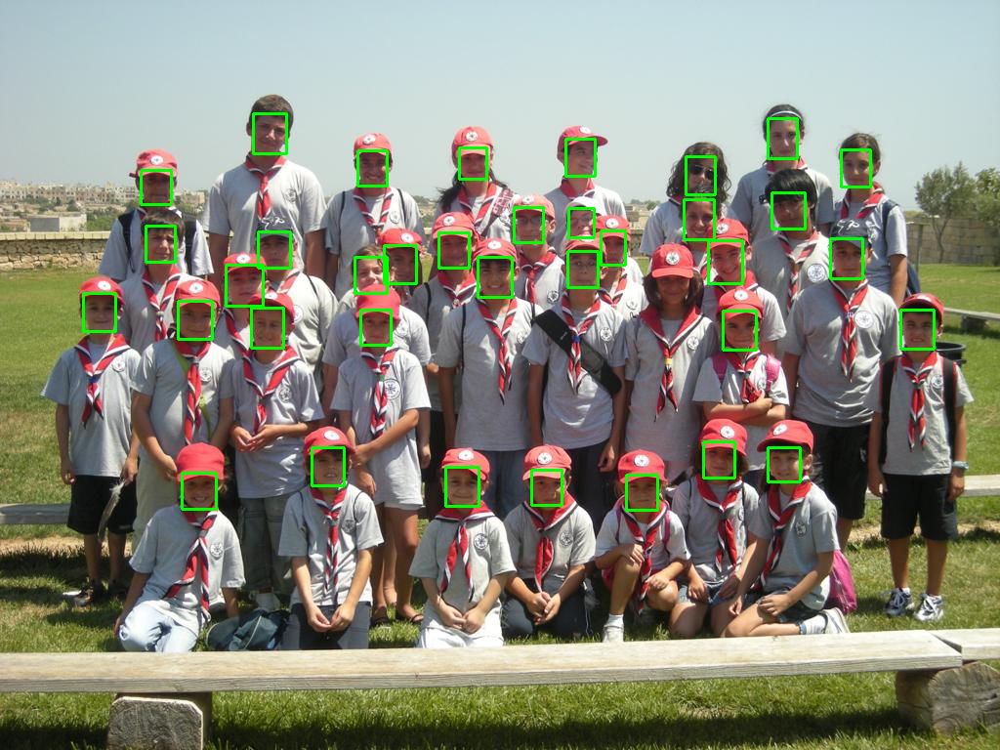

In [3]:
from mtcnn.mtcnn import MTCNN
detector = MTCNN()
import cv2
img = cv2.cvtColor( cv2.imread("./imgs/img_many.jpg"), cv2.COLOR_BGR2RGB)
from PIL import Image
Image.fromarray(img)
result = detector.detect_faces(img)
# print(result)
for result in result:
#     print(result['box'][0])
    cv2.rectangle(img,(result['box'][0],result['box'][1]),(result['box'][2]+result['box'][0],result['box'][3]+result['box'][1]),(0,255,0),2)
from PIL import Image
Image.fromarray(img)

## 总结：

以上的测试中，我们可以看出dlib和MTCNN的准确度比OpenCV要好，在多人场景识别中MTCNN比dlib在识别人脸上更为精确。